# Dataloading

In [12]:
%load_ext autoreload
%autoreload 2

In [13]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from qscaled.preprocessing import bootstrap_crossings, FullGroupedLoaderUnlabeled
from qscaled.visualization import plot_per_batch_size, plot_per_lr
from qscaled.bootstrap_envsteps_to_thresh import (
    grid_best_uncertainty_lr,
    grid_best_uncertainty_bs,
    get_bootstrap_optimal,
    compute_bootstrap_averages,
    plot_bootstrap_average_params,
    linear_fit_separate,
    linear_fit_shared,
    tabulate_proposed_params,
    tabulate_baseline_params
)

from utils.create_zip import save_and_load
from utils.configs import Config

np.random.seed(42)

To use this code:
1. Label your Wandb runs with tags.
2. Fill in `MyRunCollector` in `utils/wandb_utils.py`.
3. Update the following cell.

The latter two steps take ~5 minutes!

If you set `wandb_collect == True`, your `zip` file will be rebuilt using your
Wandb collector. Otherwise, the `zip` file must be present.

In [14]:
wandb_collect = False
wandb_collector = None  # Zip data was collected separately.
name = 'dmc_sweep'

# Maximum possible returns (estimated with infinite data and compute) on each
# environment. These are mostly eyeballed such that runs reach 80% (hence
# the 1.25 multiplier) but not 90%. There is some variation for different environments.

config = Config(
    name=name,
    max_returns={},  # No need to normalize returns, DMC is already 0-1000.
    return_key=None,  # Not present in zip data.
    utds_to_predict=[0.25, 0.5, 1, 2, 4, 8, 16],
    wandb_collector=wandb_collector,
    zip_load_cls=FullGroupedLoaderUnlabeled,
    env_step_freq=1000,
    env_step_start=5000
)

**Note:** Due to bootstrapping, outputs are randomized. We have set a random seed,
so if you restart the kernel and run all cells, your final `csv` output should
be deterministic.

If you used the code above with `save_loop`, use `UTDGroupedLoader` below.
(`FullGroupedLoaderUnlabeled` is used below for DMC data, which was collected independently.)

In [21]:
grid_search_df, (envs, utds, batch_sizes, learning_rates) = save_and_load(config)

grid_search_df = bootstrap_crossings(
    grid_search_df, 
    config.thresholds, 
    bootstrap_cache_file=f'../../cache/bootstrap_results/{name}.pkl'
)

Average standard deviation across all conditions: 9428.81


# Visualization

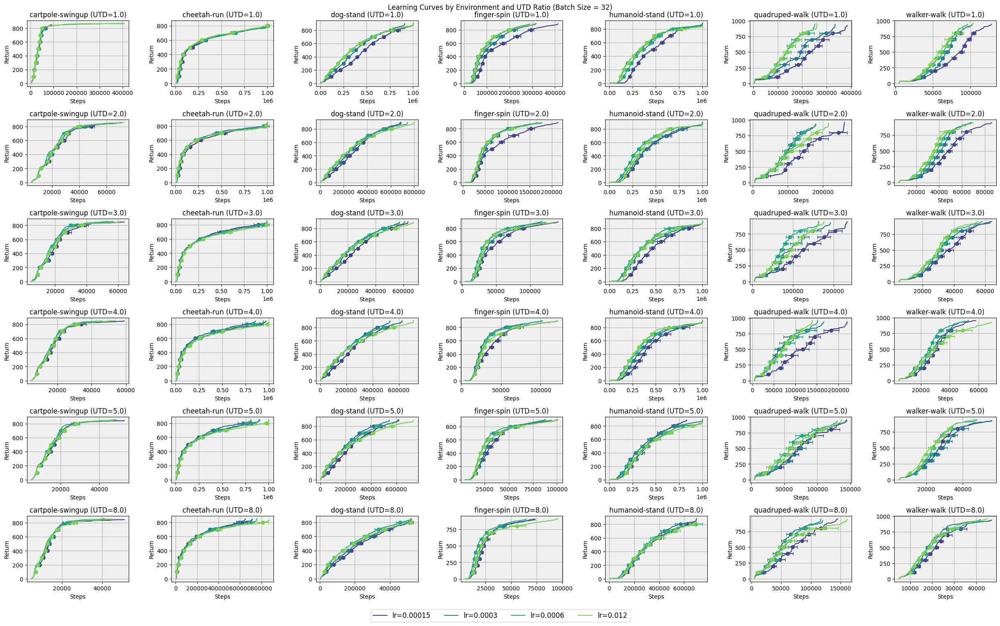

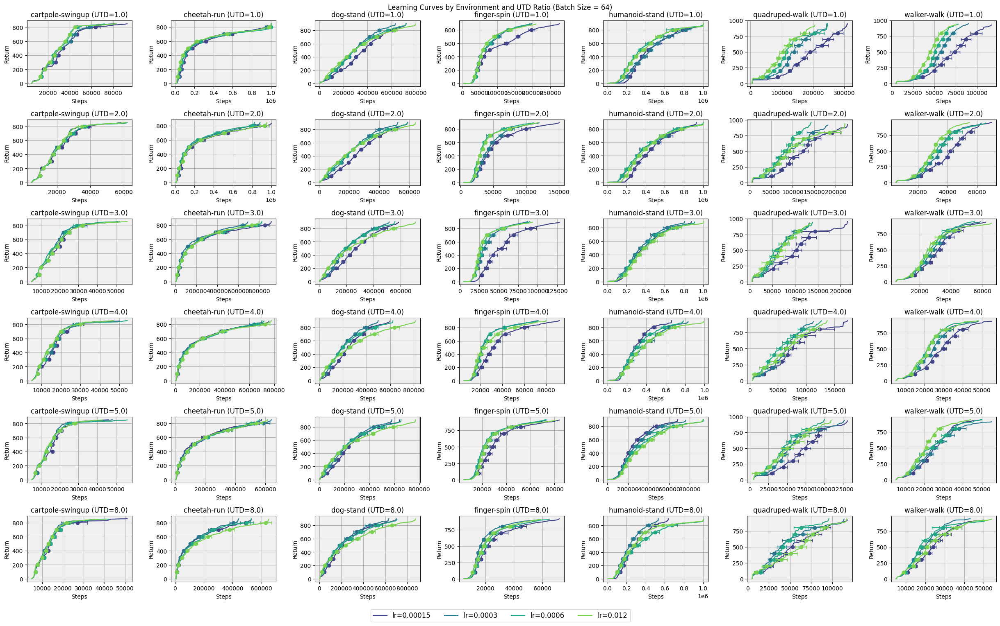

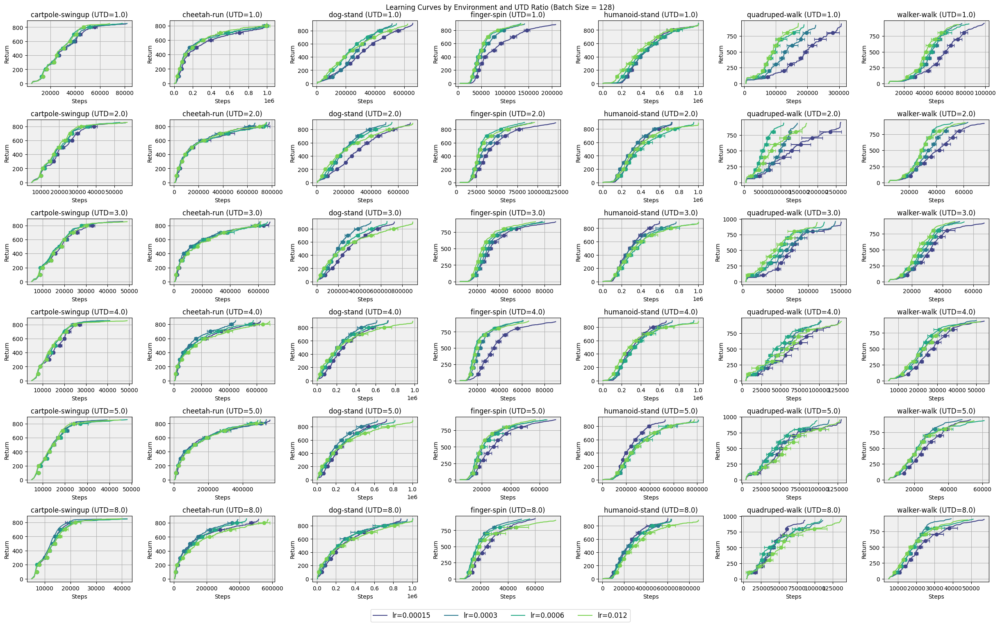

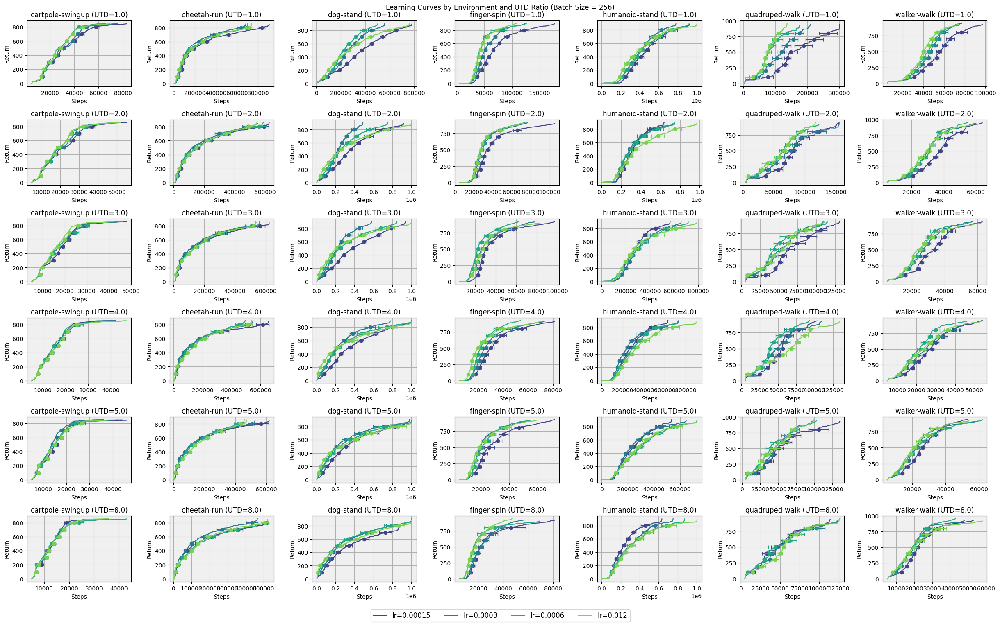

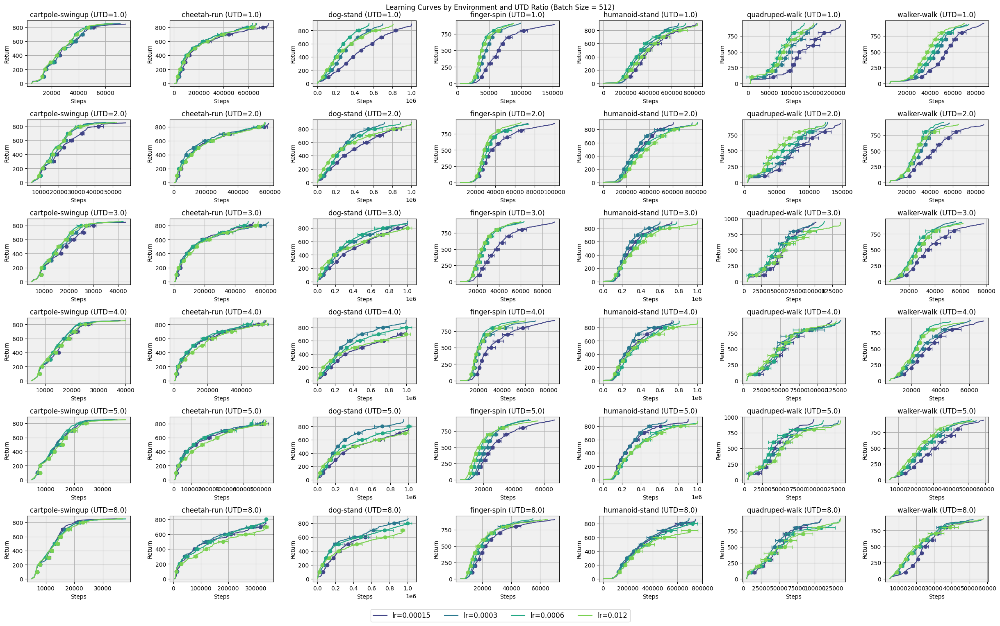

In [23]:
plot_per_batch_size(grid_search_df, len(utds), len(envs), batch_sizes, config.thresholds)

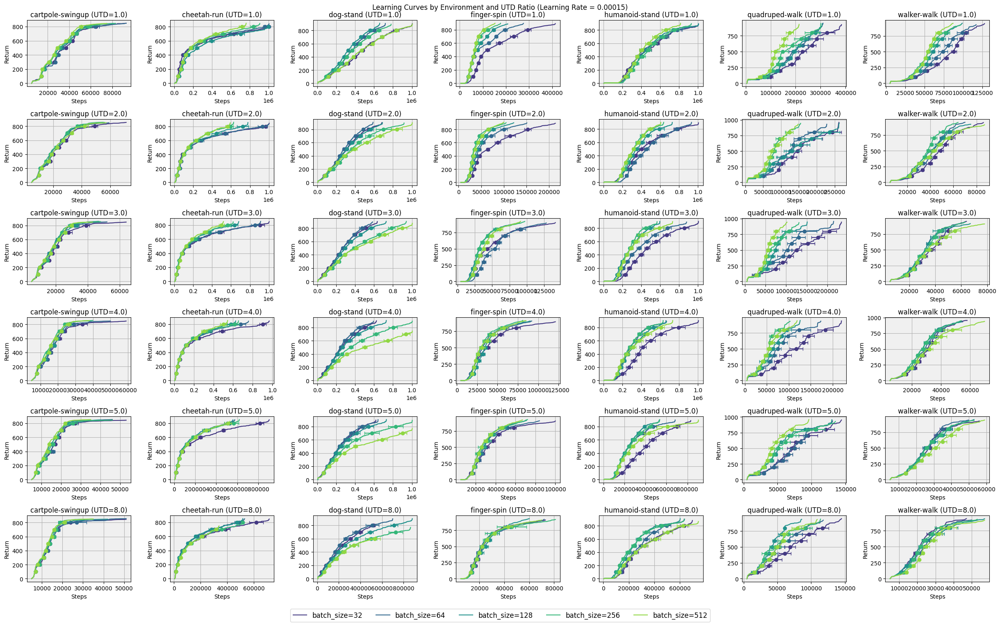

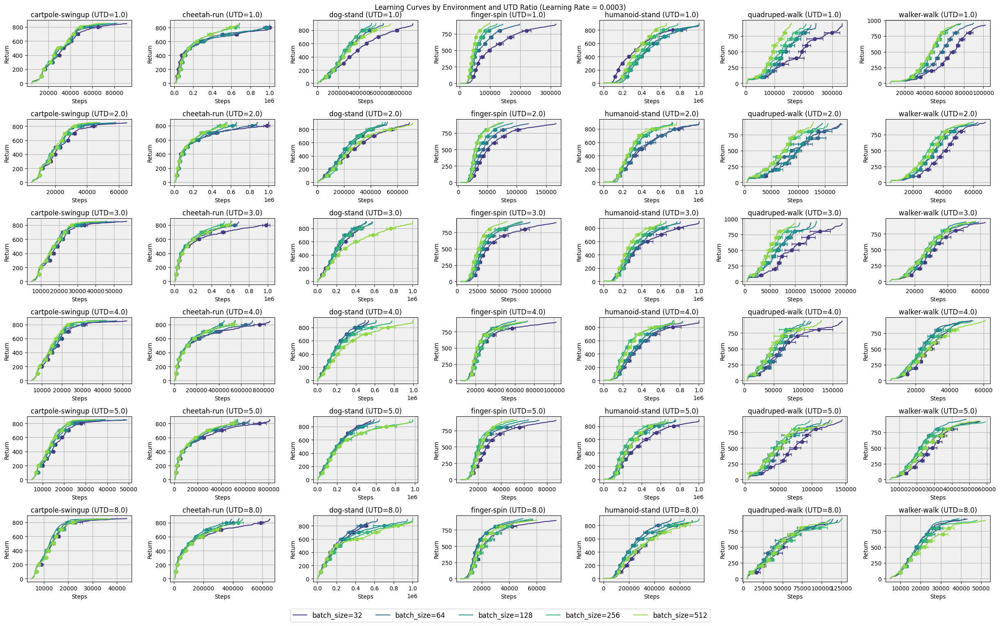

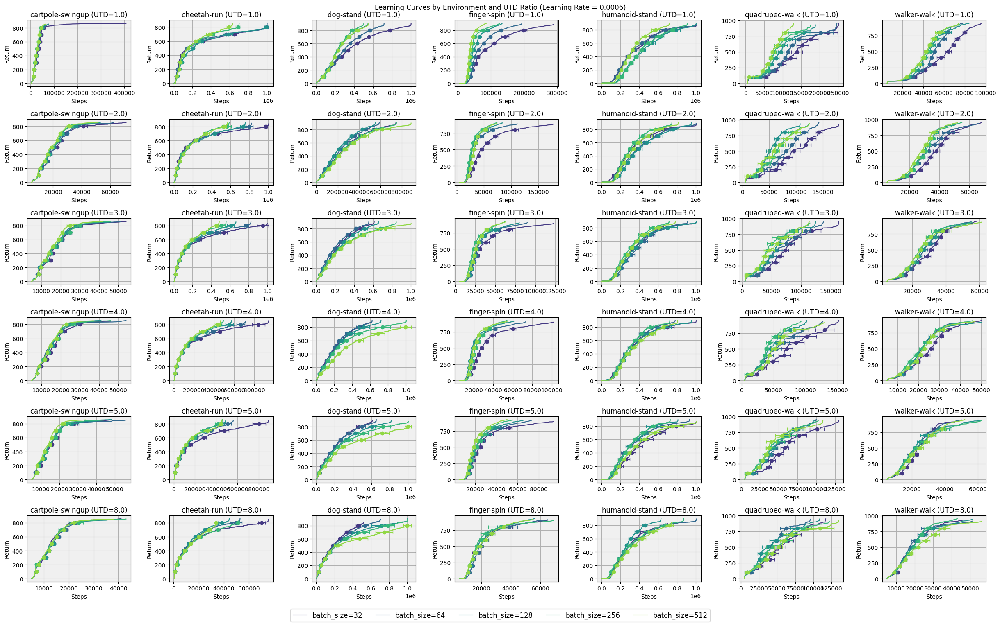

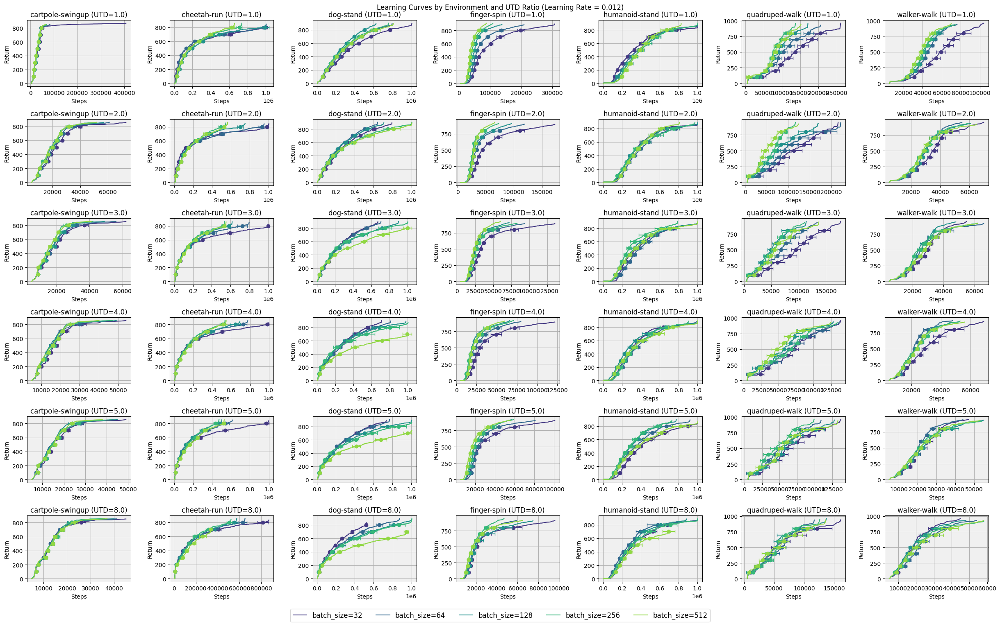

In [24]:
plot_per_lr(grid_search_df, len(utds), len(envs), learning_rates, config.thresholds)

# Bootstrapping

In [25]:
best_lr = grid_best_uncertainty_lr(grid_search_df, print_pivot=True)


Best Learning Rates:
env_name   cartpole-swingup                                 cheetah-run                                 dog-stand                                 finger-spin                                 humanoid-stand                                 quadruped-walk                                 walker-walk                                
batch_size              32      64      128     256     512         32      64      128     256     512       32      64      128     256     512         32      64      128     256     512            32      64      128     256     512            32      64      128     256     512         32      64      128     256     512
utd                                                                                                                                                                                                                                                                                                                               

In [26]:
best_bs = grid_best_uncertainty_bs(grid_search_df, print_pivot=True)


Best Batch Sizes:
env_name      cartpole-swingup                         cheetah-run                         dog-stand                         finger-spin                         humanoid-stand                         quadruped-walk                         walker-walk                        
learning_rate          1.5e-04 3.0e-04 6.0e-04 1.2e-02     1.5e-04 3.0e-04 6.0e-04 1.2e-02   1.5e-04 3.0e-04 6.0e-04 1.2e-02     1.5e-04 3.0e-04 6.0e-04 1.2e-02        1.5e-04 3.0e-04 6.0e-04 1.2e-02        1.5e-04 3.0e-04 6.0e-04 1.2e-02     1.5e-04 3.0e-04 6.0e-04 1.2e-02
utd                                                                                                                                                                                                                                                                               
1.0e+00                    512     512     256      64         512     512     512     512       128     128     256     128         512     512     512    

In [27]:
best_lr_bs = best_lr.groupby(['env_name', 'utd']).apply(get_bootstrap_optimal, include_groups=False).reset_index()
best_lr_bs = compute_bootstrap_averages(best_lr, best_bs, best_lr_bs)
best_lr_bs

,env_name,utd,best_lr,best_bs,time_to_threshold,best_lr_bootstrap,best_bs_bootstrap,time_to_threshold_bootstrap,best_bs_bootstrap_mean,best_bs_bootstrap_std,best_bs_lrmean,best_bs_lrmean_std,best_bs_bootstrap_lrmean,best_bs_bootstrap_lrmean_std,best_lr_bootstrap_mean,best_lr_bootstrap_std,best_lr_bsmean,best_lr_bsmean_std,best_lr_bootstrap_bsmean,best_lr_bootstrap_bsmean_std
0,cartpole-swingup,1.0e+00,6.0e-04,256,4.4e+04,"[0.012, 0.0006, 0.012, 0.0006, 0.0006, 0.0006,...","[128, 64, 128, 256, 256, 256, 256, 256, 128, 2...","[40000.0, 41000.0, 41000.0, 40000.0, 41000.0, ...",2.0e+02,1.2e+02,3.4e+02,2.2e+02,3.4e+02,1.8e+02,4.6e-03,5.4e-03,7.4e-03,6.2e-03,6.9e-03,5.7e-03
1,cartpole-swingup,2.0e+00,6.0e-04,512,3.1e+04,"[0.012, 0.012, 0.0006, 0.0006, 0.012, 0.0006, ...","[64, 128, 512, 512, 512, 512, 512, 256, 128, 5...","[28000.0, 26000.0, 26000.0, 25000.0, 26000.0, ...",3.4e+02,1.8e+02,3.5e+02,1.9e+02,3.3e+02,1.7e+02,5.7e-03,5.7e-03,9.7e-03,5.1e-03,6.5e-03,5.8e-03
2,cartpole-swingup,3.0e+00,6.0e-04,512,2.5e+04,"[0.0006, 0.012, 0.012, 0.0006, 0.012, 0.012, 0...","[512, 256, 256, 512, 512, 256, 512, 512, 512, ...","[21000.0, 21000.0, 20000.0, 21000.0, 20000.0, ...",4.0e+02,1.3e+02,3.8e+02,1.5e+02,3.7e+02,1.4e+02,6.4e-03,5.7e-03,2.9e-03,5.1e-03,2.8e-03,4.6e-03
3,cartpole-swingup,4.0e+00,3.0e-04,512,2.3e+04,"[0.0003, 0.0003, 0.0006, 0.0006, 0.0003, 0.000...","[256, 512, 512, 512, 512, 512, 256, 256, 128, ...","[18000.0, 18000.0, 18000.0, 18000.0, 18000.0, ...",3.9e+02,1.5e+02,3.8e+02,1.5e+02,3.8e+02,1.5e+02,1.2e-03,3.0e-03,3.9e-04,2.0e-04,1.9e-03,3.9e-03
4,cartpole-swingup,5.0e+00,1.5e-04,512,2.2e+04,"[0.012, 0.0003, 0.00015, 0.0006, 0.0003, 0.000...","[128, 512, 512, 128, 512, 128, 512, 512, 256, ...","[18000.0, 17000.0, 18000.0, 18000.0, 17000.0, ...",3.9e+02,1.8e+02,5.1e+02,0.0e+00,4.3e+02,1.5e+02,9.8e-04,2.5e-03,2.1e-04,8.2e-05,1.2e-03,3.1e-03
5,cartpole-swingup,8.0e+00,1.5e-04,256,1.9e+04,"[0.00015, 0.00015, 0.00015, 0.0003, 0.0003, 0....","[256, 256, 256, 128, 128, 128, 256, 128, 32, 2...","[15000.0, 15000.0, 14000.0, 15000.0, 14000.0, ...",1.9e+02,1.1e+02,2.9e+02,1.6e+02,2.3e+02,1.4e+02,4.7e-04,1.7e-03,2.1e-04,8.2e-05,8.6e-04,2.6e-03
6,cheetah-run,1.0e+00,3.0e-04,512,5.9e+05,"[0.0003, 0.0003, 0.0006, 0.0006, 0.0003, 0.000...","[512, 256, 512, 512, 512, 256, 512, 512, 256, ...","[558000.0, 556000.0, 602000.0, 571000.0, 59000...",4.8e+02,8.9e+01,5.1e+02,0.0e+00,4.9e+02,7.5e+01,1.0e-03,2.5e-03,2.6e-03,5.2e-03,3.2e-03,5.0e-03
7,cheetah-run,2.0e+00,3.0e-04,256,4.9e+05,"[0.012, 0.012, 0.0003, 0.0006, 0.012, 0.0006, ...","[256, 256, 256, 512, 256, 256, 512, 256, 512, ...","[451000.0, 480000.0, 425000.0, 511000.0, 49900...",3.1e+02,1.0e+02,3.8e+02,1.5e+02,3.7e+02,1.3e+02,3.0e-03,4.9e-03,3.3e-04,1.6e-04,2.1e-03,4.2e-03
8,cheetah-run,3.0e+00,6.0e-04,512,4.6e+05,"[0.00015, 0.0006, 0.0006, 0.0006, 0.0003, 0.00...","[512, 512, 512, 512, 256, 512, 512, 512, 512, ...","[464000.0, 413000.0, 460000.0, 392000.0, 41800...",4.5e+02,1.1e+02,3.8e+02,1.5e+02,4.0e+02,1.3e+02,8.1e-04,2.0e-03,3.3e-04,1.6e-04,1.7e-03,3.7e-03
9,cheetah-run,4.0e+00,3.0e-04,128,4.2e+05,"[0.0003, 0.0003, 0.0003, 0.0003, 0.0006, 0.000...","[128, 128, 128, 128, 256, 128, 128, 128, 512, ...","[395000.0, 395000.0, 385000.0, 413000.0, 38700...",2.6e+02,1.7e+02,3.5e+02,1.9e+02,3.5e+02,1.7e+02,6.4e-04,1.6e-03,4.2e-04,1.6e-04,7.3e-04,1.8e-03


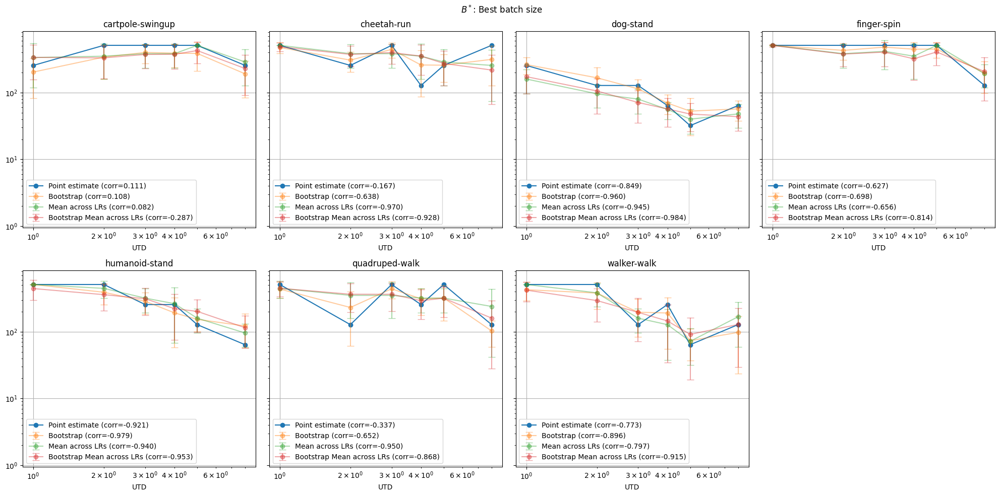

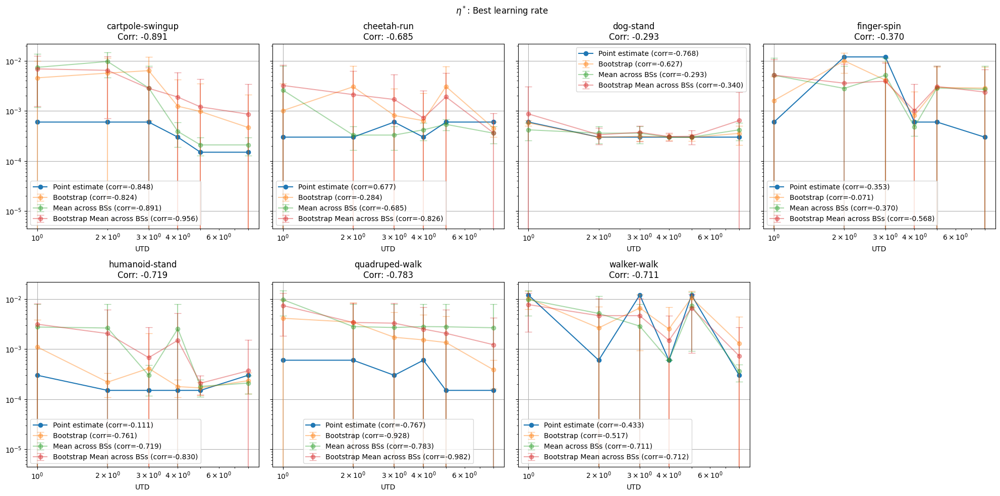

In [28]:
plot_bootstrap_average_params(best_lr_bs)

cartpole-swingup: lr ~ 323.420200 * UTD^0.134532
cheetah-run: lr ~ 491.097522 * UTD^-0.292226
dog-stand: lr ~ 177.429469 * UTD^-0.814382
finger-spin: lr ~ 476.797594 * UTD^-0.183424
humanoid-stand: lr ~ 476.752234 * UTD^-0.498495
quadruped-walk: lr ~ 444.913906 * UTD^-0.237084
walker-walk: lr ~ 477.920558 * UTD^-0.907852


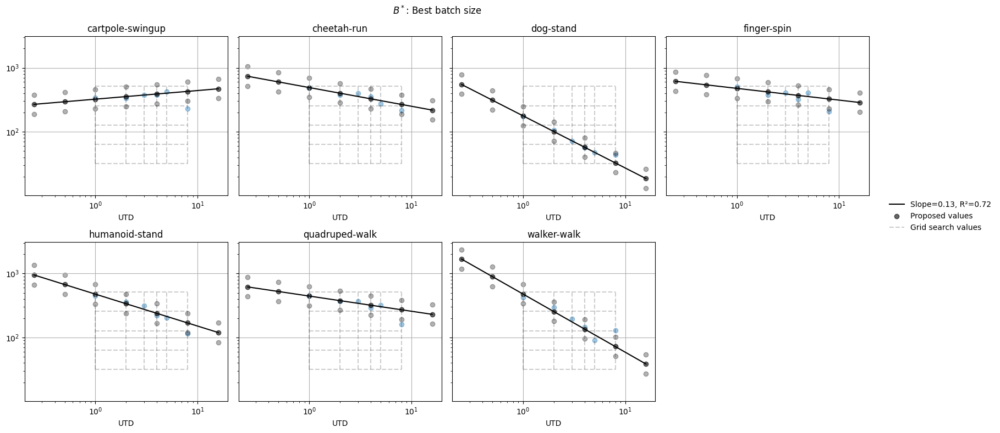

cartpole-swingup: bs ~ 0.009054 * UTD^-1.116703
cheetah-run: bs ~ 0.003084 * UTD^-0.595590
dog-stand: bs ~ 0.000720 * UTD^-0.607817
finger-spin: bs ~ 0.005300 * UTD^-0.609001
humanoid-stand: bs ~ 0.003895 * UTD^-1.356266
quadruped-walk: bs ~ 0.006879 * UTD^-0.746132
walker-walk: bs ~ 0.006855 * UTD^-0.461908


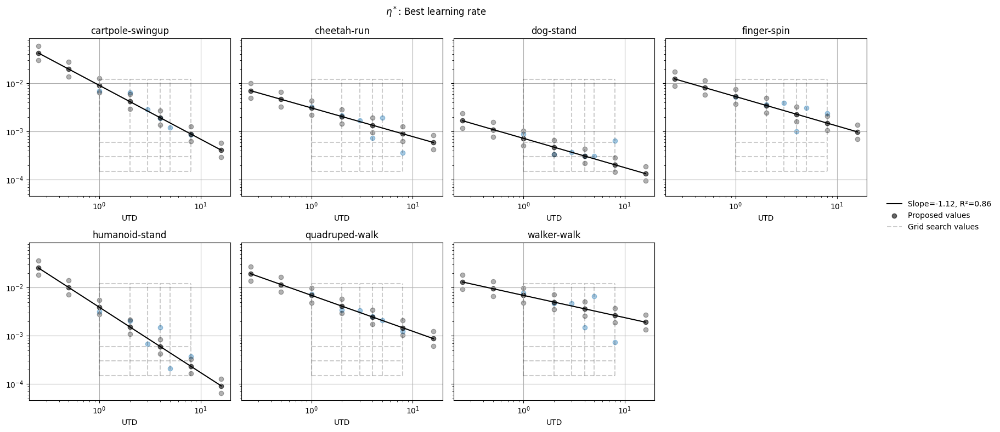

In [34]:
(
    proposed_lr_values_separate,
    proposed_bs_values_separate,
    lr_slopes_separate,
    lr_intercepts_separate,
    bs_slopes_separate,
    bs_intercepts_separate
) = linear_fit_separate(config.utds_to_predict, grid_search_df, best_lr_bs, plot=True)

cartpole-swingup: lr ~ 0.006269 * UTD^-0.799489
cheetah-run: lr ~ 0.003352 * UTD^-0.799489
dog-stand: lr ~ 0.001086 * UTD^-0.799489
finger-spin: lr ~ 0.007129 * UTD^-0.799489
humanoid-stand: lr ~ 0.002225 * UTD^-0.799489
quadruped-walk: lr ~ 0.007101 * UTD^-0.799489
walker-walk: lr ~ 0.008157 * UTD^-0.799489


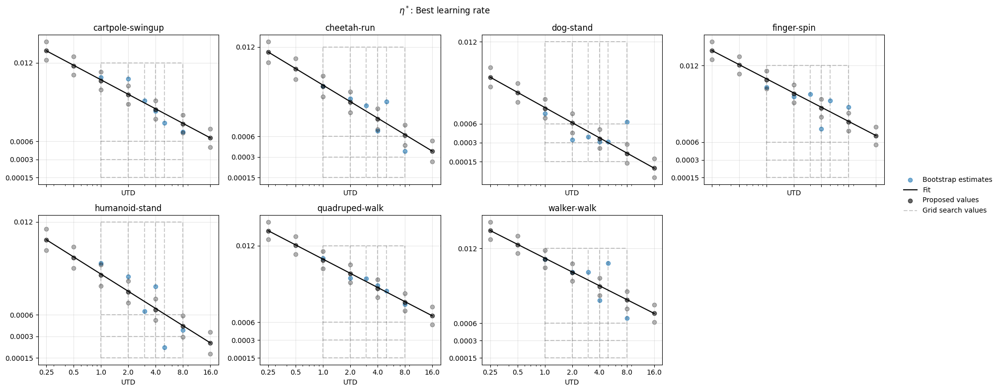

cartpole-swingup: batch size ~ 579.893172 * UTD^-0.466023
cheetah-run: batch size ~ 579.133611 * UTD^-0.466023
dog-stand: batch size ~ 124.986402 * UTD^-0.466023
finger-spin: batch size ~ 611.136865 * UTD^-0.466023
humanoid-stand: batch size ~ 430.850662 * UTD^-0.466023
quadruped-walk: batch size ~ 529.683893 * UTD^-0.466023
walker-walk: batch size ~ 317.278598 * UTD^-0.466023


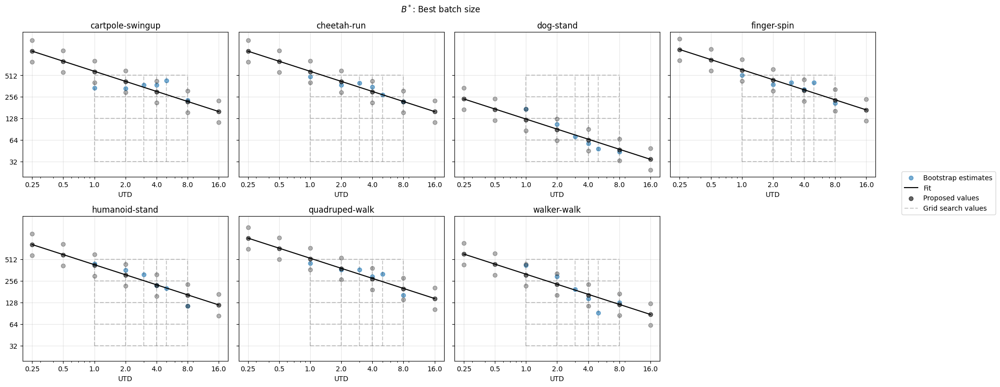

In [35]:
(
    proposed_lr_values,
    proposed_bs_values,
    lr_shared_slope,
    lr_env_intercepts,
    bs_shared_slope,
    bs_env_intercepts,
) = linear_fit_shared(config.utds_to_predict, grid_search_df, best_lr_bs, envs, name, plot=True)

In [36]:
pd.options.display.float_format = '{:.2e}'.format
proposed_values_df = tabulate_proposed_params(envs, config.utds_to_predict, proposed_lr_values, proposed_bs_values, name)
baseline_values_df = tabulate_baseline_params(grid_search_df, utds, config.utds_to_predict, len(envs), name)

Baseline based on UTD 2.0


/home/preston/value-scaling-workflow-private/qscaled/bootstrap_envsteps_to_thresh.py:1038: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utd_data['last_crossing'] = utd_data['crossings'].apply(lambda x: x[-1])


In [37]:
proposed_values_df

,Environment,UTD,Learning Rate,Learning Rate x√2,Learning Rate x√0.5,Batch Size,Batch Size x√2,Batch Size x√0.5,Batch Size(rounded),Batch Size x√2(rounded),Batch Size x√0.5(rounded)
0,cartpole-swingup,2.50e-01,1.90e-02,2.69e-02,1.34e-02,1106,1565,782,1104,1568,784
1,cartpole-swingup,5.00e-01,1.07e-02,1.52e-02,7.59e-03,793,1122,561,800,1120,560
2,cartpole-swingup,1.00e+00,6.06e-03,8.57e-03,4.29e-03,569,804,402,576,800,400
3,cartpole-swingup,2.00e+00,3.54e-03,5.01e-03,2.50e-03,416,588,294,416,592,288
4,cartpole-swingup,4.00e+00,2.00e-03,2.83e-03,1.42e-03,298,421,211,304,416,208
5,cartpole-swingup,8.00e+00,1.17e-03,1.65e-03,8.27e-04,218,308,154,224,304,160
6,cartpole-swingup,1.60e+01,6.83e-04,9.66e-04,4.83e-04,159,225,113,160,224,112
7,cheetah-run,2.50e-01,1.02e-02,1.44e-02,7.18e-03,1105,1563,781,1104,1568,784
8,cheetah-run,5.00e-01,5.74e-03,8.11e-03,4.06e-03,792,1120,560,800,1120,560
9,cheetah-run,1.00e+00,3.24e-03,4.58e-03,2.29e-03,568,803,402,576,800,400


In [38]:
baseline_values_df

,Environment,UTD,Learning Rate,Batch Size
0,cartpole-swingup,2.50e-01,6.00e-04,512
1,cartpole-swingup,5.00e-01,6.00e-04,512
2,cartpole-swingup,1,6.00e-04,512
3,cartpole-swingup,2,6.00e-04,512
4,cartpole-swingup,4,6.00e-04,512
5,cartpole-swingup,8,6.00e-04,512
6,cartpole-swingup,16,6.00e-04,512
7,cheetah-run,2.50e-01,3.00e-04,256
8,cheetah-run,5.00e-01,3.00e-04,256
9,cheetah-run,1,3.00e-04,256
